In [2]:
!pip install yfinance
!pip install copulas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 kB 2.3 MB/s eta 0:00:00


In [3]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import datetime as dt
import seaborn as sns
from scipy.stats import norm
from scipy.stats import t,  beta
from warnings import filterwarnings
filterwarnings('ignore')
from scipy.stats import cauchy
from itertools import combinations
from statsmodels.distributions.empirical_distribution import ECDF
from copulas.multivariate import GaussianMultivariate
from mpl_toolkits.mplot3d import Axes3D
from copulas.bivariate import Clayton
from copulas.multivariate import VineCopula

In [4]:
end_date = dt.datetime(2025, 3, 1)
start_date = end_date - dt.timedelta(days=365*6)

In [5]:
tickers =['^NBI','^IXIC','^GSPC','^RUT', 'BTC-USD','^DJI']

In [6]:
quotes = pd.DataFrame()
for ticker in tickers:
  quotes[ticker] = yf.download(ticker, start_date, end_date)['Close']

quotes = quotes.dropna()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [7]:
log_return = np.log(quotes/quotes.shift(1)).dropna()

In [8]:
Skewness =  log_return.skew()
Kurtosis = log_return.kurt()
mean = log_return.mean()
std = log_return.std()
pd.DataFrame({'Skewness': Skewness, 'Kurtosis': Kurtosis, 'Mean': mean, 'Standard Deviation': std})

,Skewness,Kurtosis,Mean,Standard Deviation
^NBI,-0.265027,3.429429,0.000154,0.015098
^IXIC,-0.650043,7.336789,0.000605,0.015274
^GSPC,-0.852855,15.294763,0.000502,0.012725
^RUT,-0.896546,10.032583,0.000210,0.016725
BTC-USD,-0.949588,13.452343,0.002064,0.041727
^DJI,-1.018055,23.406636,0.000351,0.012393


In [9]:
log_return_cdf = log_return.apply(lambda col:ECDF(col))
transcdf = log_return.apply(lambda col:log_return_cdf[col.name](col))

In [10]:
#Gaussian Copula
copula = GaussianMultivariate()
copula.fit(transcdf)
synthetic_data = copula.sample(len(transcdf))


In [12]:
# VineCopula
vine_d = VineCopula('direct')
vine_d.fit(transcdf)

trees = vine_d.trees
vine_d_samples = vine_d.sample(len(transcdf))


In [26]:
#C-Vine Copula
vine_c = VineCopula('center')
vine_c.fit(transcdf)
trees = vine_c.trees
vine_c_samples = vine_c.sample(len(transcdf))

In [15]:
def plotter(df):
  variables = list(quotes.columns)
  pairs = list(combinations(variables, 2))
  fig, axes = plt.subplots(5,3, figsize=(14,18))
  axes = axes.flatten()

  for i, (var1, var2) in enumerate(pairs):
    axes[i].scatter(df[var1], df[var2], label ='Simulated', alpha=0.4)
    axes[i].scatter(transcdf[var1], transcdf[var2], label ='Original', alpha=0.2)
    axes[i].set_xlabel(var1)
    axes[i].set_ylabel(var2)
    axes[i].set_title(f'{var1} vs {var2}')
    axes[i].legend()

  plt.tight_layout()
  plt.show()


In [20]:
def plotter_3d(df):
  variables = list(df.columns)
  pairs = list(combinations(variables, 3))
  fig, axes = plt.subplots(5, 4, figsize=(16, 22), subplot_kw={'projection': '3d'})
  axes = axes.flatten()

  for i, (var1, var2, var3) in enumerate(pairs):
    axes[i].scatter(df[var1], df[var2], df[var3], label='Simulated', alpha=0.4)
    axes[i].scatter(transcdf[var1], transcdf[var2], transcdf[var3], label='Original', alpha=0.4)
    axes[i].set_xlabel(var1)
    axes[i].set_ylabel(var2)
    axes[i].set_zlabel(var3)
    axes[i].set_title(f'{var1} vs {var2} vs {var3}')
    axes[i].legend()

  plt.tight_layout()
  plt.show()

Tree 1:
L:0 R:3 D:set() Copula:CopulaTypes.FRANK Theta:5.914157984370666
L:2 R:3 D:set() Copula:CopulaTypes.FRANK Theta:8.859776454153884
L:1 R:2 D:set() Copula:CopulaTypes.FRANK Theta:16.747655826417187
L:2 R:5 D:set() Copula:CopulaTypes.FRANK Theta:13.48115100759769
L:3 R:4 D:set() Copula:CopulaTypes.FRANK Theta:1.9020787589518042
Tree 2:
L:0 R:2 D:{3} Copula:CopulaTypes.FRANK Theta:1.0639219384411098
L:3 R:5 D:{2} Copula:CopulaTypes.GUMBEL Theta:1.2524430326937044
L:1 R:5 D:{2} Copula:CopulaTypes.FRANK Theta:-4.298977048562079
L:2 R:4 D:{3} Copula:CopulaTypes.GUMBEL Theta:1.043484857680403
Tree 3:
L:0 R:4 D:{2, 3} Copula:CopulaTypes.GUMBEL Theta:1.0226515722272889
L:0 R:5 D:{2, 3} Copula:CopulaTypes.FRANK Theta:-0.5326275262035128
L:1 R:3 D:{2, 5} Copula:CopulaTypes.FRANK Theta:1.4692329706813323


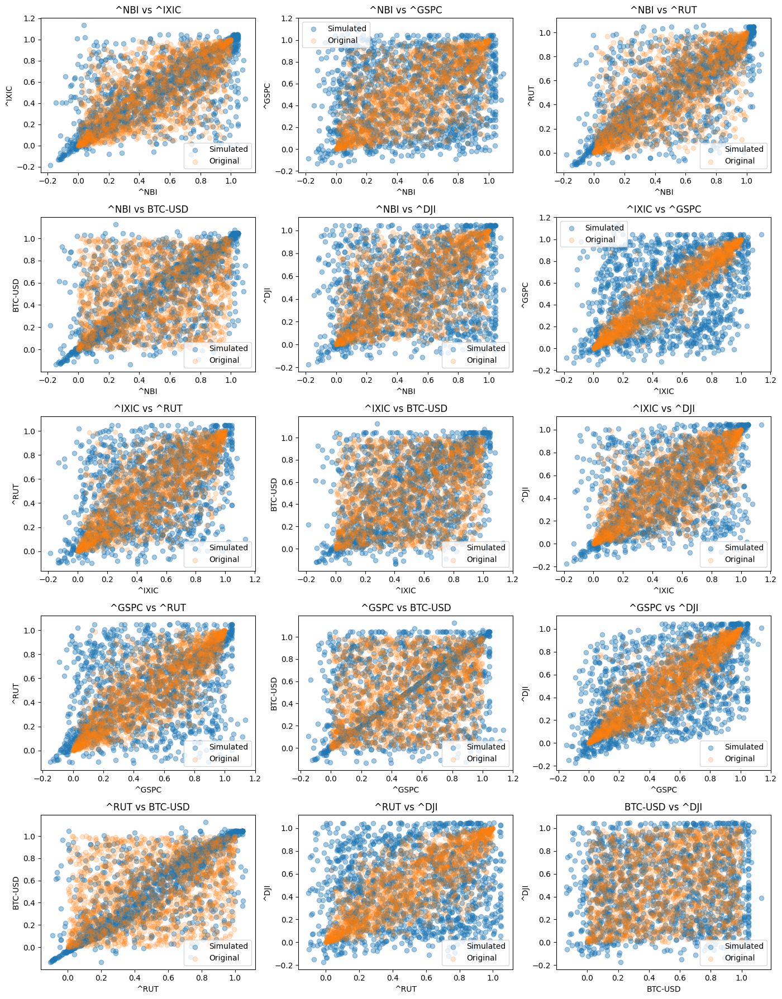

In [18]:
#R-Vine Copula

vine_r = VineCopula('regular')
vine_r.fit(transcdf)

trees = vine_r.trees
for i, tree in enumerate(trees):
    print(f"Tree {i+1}:")
    print(tree)

vine_r_samples = vine_r.sample(len(transcdf))
plotter(vine_r_samples)

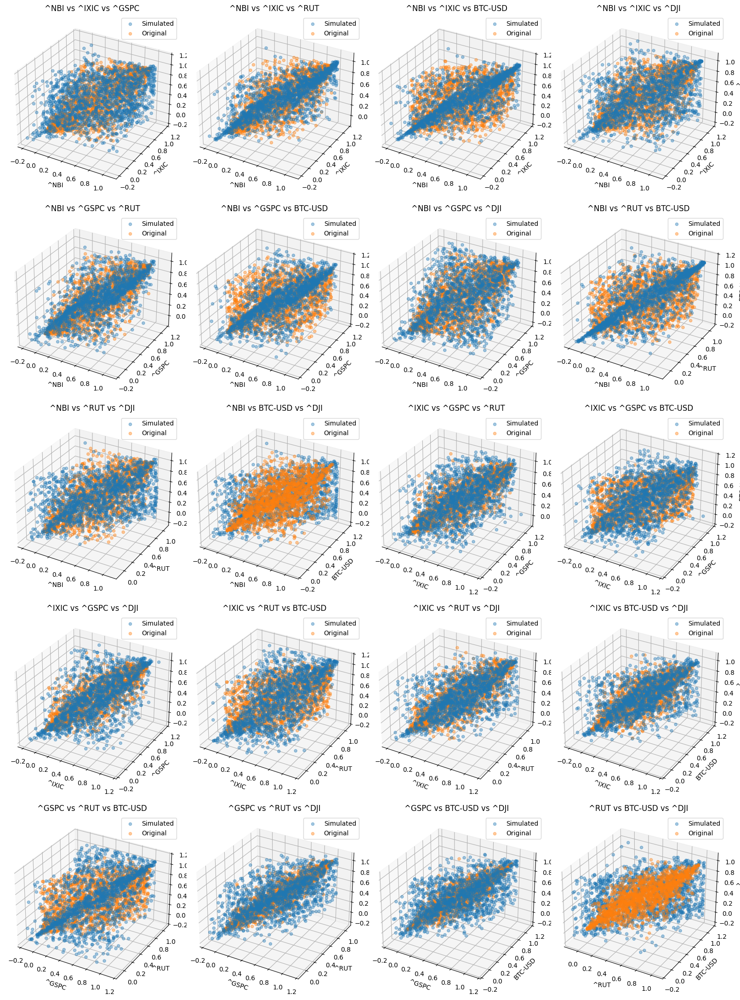

In [19]:
plotter_3d(vine_r_samples)

In [21]:
# Clayton Copula
def Clayton_copula(df):
    clayton = Clayton()

    variables = list(df.columns)
    pairs = list(combinations(variables, 2))
    for var1, var2 in pairs:
        transcdf_1 = df[[var1, var2]].to_numpy()

        clayton.fit(transcdf_1)

        clayton_samples = clayton.sample(len(transcdf_1))
    return df

Clayton_copula_sample = Clayton_copula(transcdf)
Clayton_copula_sample.head()

,^NBI,^IXIC,^GSPC,^RUT,BTC-USD,^DJI
Date,,,,,,
2019-03-05,0.345056,0.441274,0.396815,0.348374,0.845388,0.431321
2019-03-06,0.019907,0.199071,0.205707,0.072993,0.511612,0.223623
2019-03-07,0.287989,0.167220,0.157930,0.244194,0.510949,0.149967
2019-03-08,0.337094,0.372926,0.339748,0.453882,0.451891,0.412741
2019-03-11,0.936297,0.933643,0.925680,0.889184,0.501659,0.814864


In [22]:
def plot_clayton_copula(df):
    clayton = Clayton()
    variables = list(df.columns)
    pairs = list(combinations(variables, 2))
    fig, axes = plt.subplots(5, 3, figsize=(16, 22))
    axes = axes.flatten()

    for i, (var1, var2) in enumerate(pairs):
        transcdf_1 = df[[var1, var2]].to_numpy()
        clayton.fit(transcdf_1)
        clayton_samples = clayton.sample(len(transcdf_1))
        axes[i].scatter(transcdf_1[:, 0], transcdf_1[:, 1], label='Original', alpha=0.4)
        axes[i].scatter(clayton_samples[:, 0], clayton_samples[:, 1], label='Clayton Copula', alpha=0.4)
        axes[i].set_xlabel(var1)
        axes[i].set_ylabel(var2)
        axes[i].set_title(f'{var1} vs {var2}')
        axes[i].legend()
    plt.tight_layout()
    plt.show()


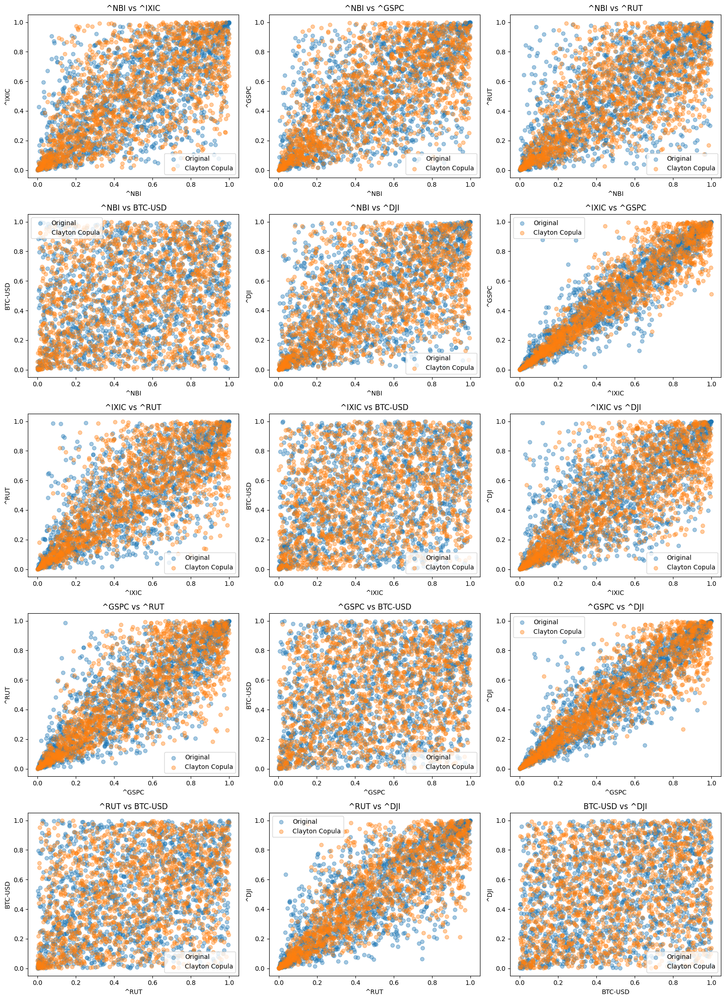

In [23]:
plot_clayton_copula(transcdf)

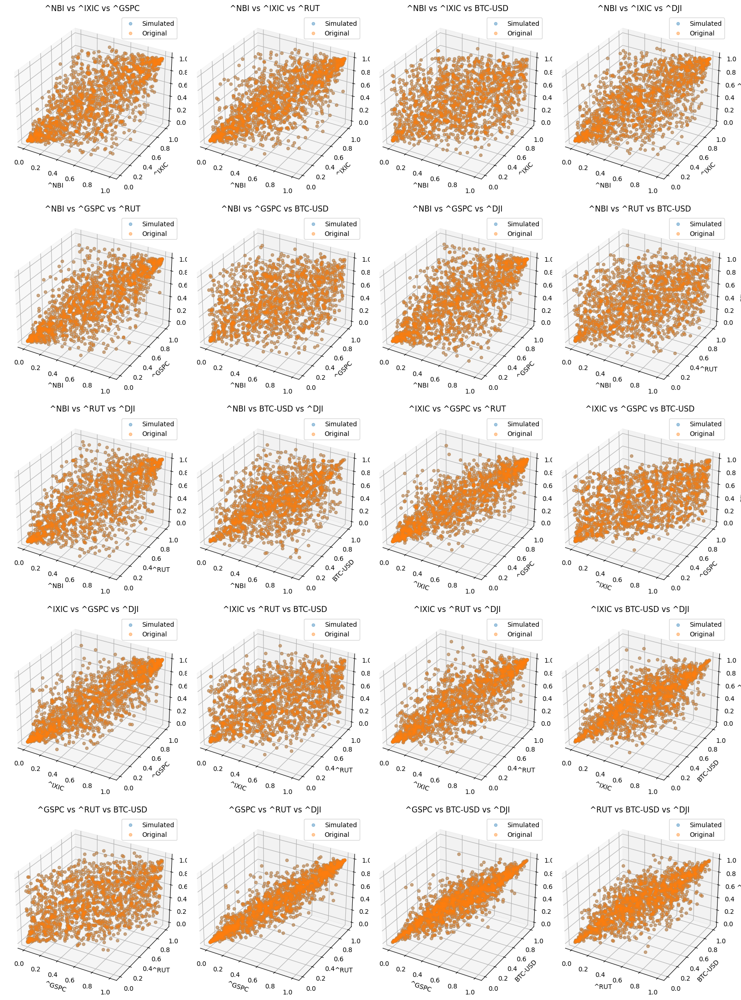

In [25]:
plotter_3d(transcdf)

Gaussian VaR at 99% confidence level is $ 2205.52
Clayton VaR at 99% confidence level is $ 2205.91
Vine_d VaR at 99% confidence level is $ 1667.88
Vine_c VaR at 99% confidence level is $ 1882.44
Vine_r VaR at 99% confidence level is $ 1888.64
Covariance VaR at 99% confidence level is $ 2094.86


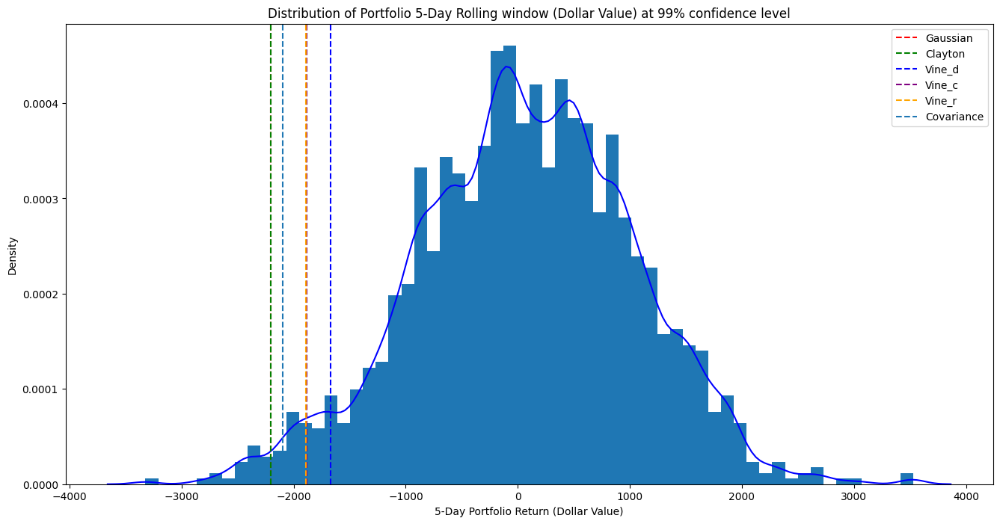

In [27]:
#VaR
portfolio_value  = 500000
investment_per_asset = portfolio_value / len(quotes)

equally_weg = [investment_per_asset/quotes for quotes in quotes.iloc[-1]]

pd.DataFrame({'Price': quotes.iloc[-1],
              'Shares':equally_weg})

#Covariance Method
cov_sample_return = (log_return * equally_weg).sum(axis=1)

Gaussian = synthetic_data
Vine_d = vine_d_samples
Vine_c = vine_c_samples
Vine_r = vine_r_samples
Clayton = Clayton_copula_sample
Covariance = cov_sample_return

model_names = ['Gaussian', 'Clayton', 'Vine_d', 'Vine_c', 'Vine_r']

confidence_interval = 0.99
window = 5
portfolio_value = 100000
var = []
all_range_return = []

for model_name in model_names:
    marginals = [norm.fit(log_return[asset]) for asset in log_return.columns]
    simulated_returns = np.array([norm.ppf(eval(model_name).iloc[:,j], *marginals[j]) for j in range(len(log_return.columns))]).T
    simulated_portfolio_returns = np.sum(simulated_returns * equally_weg, axis=1)
    simulated_portfolio_returns = pd.Series(simulated_portfolio_returns)

    range_return = simulated_portfolio_returns.rolling(window=window).sum().dropna()  # period
    all_range_return.append(range_return)

    VaR = np.percentile(range_return, 100-(1-confidence_interval)*100)*portfolio_value
    var.append(VaR)
    print(f'{model_name} VaR at {confidence_interval:.0%} confidence level is $ {VaR:.2f}')

plt.figure(figsize=(16, 8))
plt.hist(all_range_return[0]*portfolio_value, bins=60, density=True)
sns.kdeplot(all_range_return[0]*portfolio_value, bw_adjust=0.5, color='blue')
colors = ['red', 'green', 'blue', 'purple', 'orange']
for idx, VaR in enumerate(var):
    color = colors[idx % len(colors)]
    plt.axvline(-VaR, linestyle='dashed', color=color, label=f'{model_names[idx]}')
#Covariance mathod
cov_sample_return = (log_return * equally_weg).sum(axis=1)
range_return = cov_sample_return.rolling(window=window).sum().dropna()
VaR_1 = np.percentile(range_return, 100 - (1 - confidence_interval) * 100)* portfolio_value
print(f'Covariance VaR at {confidence_interval:.0%} confidence level is $ {VaR_1:.2f}')
plt.axvline(-VaR_1, linestyle='dashed', label=f'Covariance')

plt.ylabel('Density')
plt.xlabel(f'{window}-Day Portfolio Return (Dollar Value)')
plt.title(f'Distribution of Portfolio {window}-Day Rolling window (Dollar Value) at {confidence_interval:.0%} confidence level')
plt.legend()
plt.show()